<a href="https://colab.research.google.com/github/amarathe/ELEN521_labs/blob/master/Lab8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lab 8 
Ashwin Marathe, Sharanjeet Singh

1. Generate MNIST
2. Generate Pokemon

# 1. Generate MNIST

In [6]:
%tensorflow_version 2.0
%matplotlib inline

# 1. Take a look at:
# https://keras.io/examples/mnist_acgan/ (Links to an external site.)
#
# We will use a DCGAN to generate new pokemons or african fabric images
#
# Dataset are in:
#    https://www.kaggle.com/vishalsubbiah/pokemon-images-and-types

from __future__ import print_function

from collections import defaultdict
try:
    import cPickle as pickle
except ImportError:
    import pickle
from PIL import Image

from six.moves import range

import tensorflow
from tensorflow.keras.datasets import mnist
from tensorflow.keras import layers
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Embedding, Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import Conv2DTranspose, Conv2D
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import Progbar
import numpy as np

np.random.seed(1337)
num_classes = 10


def build_generator(latent_size):
    # we will map a pair of (z, L), where z is a latent vector and L is a
    # label drawn from P_c, to image space (..., 28, 28, 1)
    cnn = Sequential()

    cnn.add(Dense(3 * 3 * 384, input_dim=latent_size, activation='relu'))
    cnn.add(Reshape((3, 3, 384)))

    # upsample to (7, 7, ...)
    cnn.add(Conv2DTranspose(192, 5, strides=1, padding='valid',
                            activation='relu',
                            kernel_initializer='glorot_normal'))
    cnn.add(BatchNormalization())

    # upsample to (14, 14, ...)
    cnn.add(Conv2DTranspose(96, 5, strides=2, padding='same',
                            activation='relu',
                            kernel_initializer='glorot_normal'))
    cnn.add(BatchNormalization())

    # upsample to (28, 28, ...)
    cnn.add(Conv2DTranspose(1, 5, strides=2, padding='same',
                            activation='tanh',
                            kernel_initializer='glorot_normal'))

    # this is the z space commonly referred to in GAN papers
    latent = Input(shape=(latent_size, ))

    # this will be our label
    image_class = Input(shape=(1,), dtype='int32')

    cls = Embedding(num_classes, latent_size,
                    embeddings_initializer='glorot_normal')(image_class)

    # hadamard product between z-space and a class conditional embedding
    h = layers.multiply([latent, cls])

    fake_image = cnn(h)

    return Model([latent, image_class], fake_image)


def build_discriminator():
    # build a relatively standard conv net, with LeakyReLUs as suggested in
    # the reference paper
    cnn = Sequential()

    cnn.add(Conv2D(32, 3, padding='same', strides=2,
                   input_shape=(28, 28, 1)))
    cnn.add(LeakyReLU(0.2))
    cnn.add(Dropout(0.3))

    cnn.add(Conv2D(64, 3, padding='same', strides=1))
    cnn.add(LeakyReLU(0.2))
    cnn.add(Dropout(0.3))

    cnn.add(Conv2D(128, 3, padding='same', strides=2))
    cnn.add(LeakyReLU(0.2))
    cnn.add(Dropout(0.3))

    cnn.add(Conv2D(256, 3, padding='same', strides=1))
    cnn.add(LeakyReLU(0.2))
    cnn.add(Dropout(0.3))

    cnn.add(Flatten())

    image = Input(shape=(28, 28, 1))

    features = cnn(image)

    # first output (name=generation) is whether or not the discriminator
    # thinks the image that is being shown is fake, and the second output
    # (name=auxiliary) is the class that the discriminator thinks the image
    # belongs to.
    fake = Dense(1, activation='sigmoid', name='generation')(features)
    aux = Dense(num_classes, activation='softmax', name='auxiliary')(features)

    return Model(image, [fake, aux])


if __name__ == '__main__':
    # batch and latent size taken from the paper
    epochs = 4
    batch_size = 100
    latent_size = 100

    # Adam parameters suggested in https://arxiv.org/abs/1511.06434
    adam_lr = 0.0002
    adam_beta_1 = 0.5

    # build the discriminator
    print('Discriminator model:')
    discriminator = build_discriminator()
    discriminator.compile(
        optimizer=Adam(learning_rate=adam_lr, beta_1=adam_beta_1),
        loss=['binary_crossentropy', 'sparse_categorical_crossentropy']
    )
    discriminator.summary()

    # build the generator
    generator = build_generator(latent_size)

    latent = Input(shape=(latent_size, ))
    image_class = Input(shape=(1,), dtype='int32')

    # get a fake image
    fake = generator([latent, image_class])

    # we only want to be able to train generation for the combined model
    discriminator.trainable = False
    fake, aux = discriminator(fake)
    combined = Model([latent, image_class], [fake, aux])

    print('Combined model:')
    combined.compile(
        optimizer=Adam(learning_rate=adam_lr, beta_1=adam_beta_1),
        loss=['binary_crossentropy', 'sparse_categorical_crossentropy']
    )
    combined.summary()

    # get our mnist data, and force it to be of shape (..., 28, 28, 1) with
    # range [-1, 1]
    (x_train, y_train), (x_test, y_test) = mnist.load_data()
#    print ("MNIST y_test[0]", y_test[0])
    x_train = (x_train.astype(np.float32) - 127.5) / 127.5
    print ("x_train shape0 pre-expand:", x_train.shape)

    x_train = np.expand_dims(x_train, axis=-1)
    print ("x_train shape0:", x_train.shape)


    x_test = (x_test.astype(np.float32) - 127.5) / 127.5
    x_test = np.expand_dims(x_test, axis=-1)

    num_train, num_test = x_train.shape[0], x_test.shape[0]

    train_history = defaultdict(list)
    test_history = defaultdict(list)

    for epoch in range(1, epochs + 1):
        print('Epoch {}/{}'.format(epoch, epochs))

        num_batches = int(np.ceil(x_train.shape[0] / float(batch_size)))
        progress_bar = Progbar(target=num_batches)

        epoch_gen_loss = []
        epoch_disc_loss = []

        for index in range(num_batches):
            # get a batch of real images
            image_batch = x_train[index * batch_size:(index + 1) * batch_size]
            label_batch = y_train[index * batch_size:(index + 1) * batch_size]

            # generate a new batch of noise
            noise = np.random.uniform(-1, 1, (len(image_batch), latent_size))

            # sample some labels from p_c
            sampled_labels = np.random.randint(0, num_classes, len(image_batch))

            # generate a batch of fake images, using the generated labels as a
            # conditioner. We reshape the sampled labels to be
            # (len(image_batch), 1) so that we can feed them into the embedding
            # layer as a length one sequence
            generated_images = generator.predict(
                [noise, sampled_labels.reshape((-1, 1))], verbose=0)

            x = np.concatenate((image_batch, generated_images))

            # use one-sided soft real/fake labels
            # Salimans et al., 2016
            # https://arxiv.org/pdf/1606.03498.pdf (Section 3.4)
            soft_zero, soft_one = 0, 0.95
            y = np.array(
                [soft_one] * len(image_batch) + [soft_zero] * len(image_batch))
            aux_y = np.concatenate((label_batch, sampled_labels), axis=0)

            # we don't want the discriminator to also maximize the classification
            # accuracy of the auxiliary classifier on generated images, so we
            # don't train discriminator to produce class labels for generated
            # images (see https://openreview.net/forum?id=rJXTf9Bxg).
            # To preserve sum of sample weights for the auxiliary classifier,
            # we assign sample weight of 2 to the real images.
            disc_sample_weight = [np.ones(2 * len(image_batch)),
                                  np.concatenate((np.ones(len(image_batch)) * 2,
                                                  np.zeros(len(image_batch))))]

            # see if the discriminator can figure itself out...
            epoch_disc_loss.append(discriminator.train_on_batch(
                x, [y, aux_y], sample_weight=disc_sample_weight))

            # make new noise. we generate 2 * batch size here such that we have
            # the generator optimize over an identical number of images as the
            # discriminator
            noise = np.random.uniform(-1, 1, (2 * len(image_batch), latent_size))
            sampled_labels = np.random.randint(0, num_classes, 2 * len(image_batch))

            # we want to train the generator to trick the discriminator
            # For the generator, we want all the {fake, not-fake} labels to say
            # not-fake
            trick = np.ones(2 * len(image_batch)) * soft_one

            epoch_gen_loss.append(combined.train_on_batch(
                [noise, sampled_labels.reshape((-1, 1))],
                [trick, sampled_labels]))

            progress_bar.update(index + 1)

        print('Testing for epoch {}:'.format(epoch))

        # evaluate the testing loss here

        # generate a new batch of noise
        noise = np.random.uniform(-1, 1, (num_test, latent_size))

        # sample some labels from p_c and generate images from them
        sampled_labels = np.random.randint(0, num_classes, num_test)
        generated_images = generator.predict(
            [noise, sampled_labels.reshape((-1, 1))], verbose=False)

        x = np.concatenate((x_test, generated_images))
        y = np.array([1] * num_test + [0] * num_test)
        aux_y = np.concatenate((y_test, sampled_labels), axis=0)

        # see if the discriminator can figure itself out...
        discriminator_test_loss = discriminator.evaluate(
            x, [y, aux_y], verbose=False)

        discriminator_train_loss = np.mean(np.array(epoch_disc_loss), axis=0)

        # make new noise
        noise = np.random.uniform(-1, 1, (2 * num_test, latent_size))
        sampled_labels = np.random.randint(0, num_classes, 2 * num_test)

        trick = np.ones(2 * num_test)

        generator_test_loss = combined.evaluate(
            [noise, sampled_labels.reshape((-1, 1))],
            [trick, sampled_labels], verbose=False)

        generator_train_loss = np.mean(np.array(epoch_gen_loss), axis=0)

        # generate an epoch report on performance
        train_history['generator'].append(generator_train_loss)
        train_history['discriminator'].append(discriminator_train_loss)

        test_history['generator'].append(generator_test_loss)
        test_history['discriminator'].append(discriminator_test_loss)

        print('{0:<22s} | {1:4s} | {2:15s} | {3:5s}'.format(
            'component', *discriminator.metrics_names))
        print('-' * 65)

        ROW_FMT = '{0:<22s} | {1:<4.2f} | {2:<15.4f} | {3:<5.4f}'
        print(ROW_FMT.format('generator (train)',
                             *train_history['generator'][-1]))
        print(ROW_FMT.format('generator (test)',
                             *test_history['generator'][-1]))
        print(ROW_FMT.format('discriminator (train)',
                             *train_history['discriminator'][-1]))
        print(ROW_FMT.format('discriminator (test)',
                             *test_history['discriminator'][-1]))

        # save weights every epoch
        generator.save_weights(
            'params_generator_epoch_{0:03d}.hdf5'.format(epoch), True)
        discriminator.save_weights(
            'params_discriminator_epoch_{0:03d}.hdf5'.format(epoch), True)

        # generate some digits to display
        num_rows = 40
        noise = np.tile(np.random.uniform(-1, 1, (num_rows, latent_size)),
                        (num_classes, 1))

        sampled_labels = np.array([
            [i] * num_rows for i in range(num_classes)
        ]).reshape(-1, 1)

        # get a batch to display
        generated_images = generator.predict(
            [noise, sampled_labels], verbose=0)

        # prepare real images sorted by class label
        real_labels = y_train[(epoch - 1) * num_rows * num_classes:
                              epoch * num_rows * num_classes]
        indices = np.argsort(real_labels, axis=0)
        real_images = x_train[(epoch - 1) * num_rows * num_classes:
                              epoch * num_rows * num_classes][indices]

        # display generated images, white separator, real images
        img = np.concatenate(
            (generated_images,
             np.repeat(np.ones_like(x_train[:1]), num_rows, axis=0),
             real_images))

        # arrange them into a grid
        #print ("img shape:", img.shape)

        img = (np.concatenate([r.reshape(-1, 28)
                               for r in np.split(img, 2 * num_classes + 1)
                               ], axis=-1) * 127.5 + 127.5).astype(np.uint8)

        Image.fromarray(img).save(
            'plot_epoch_{0:03d}_generated.png'.format(epoch))

    with open('acgan-history.pkl', 'wb') as f:
        pickle.dump({'train': train_history, 'test': test_history}, f)

`%tensorflow_version` only switches the major version: 1.x or 2.x.
You set: `2.0`. This will be interpreted as: `2.x`.


TensorFlow is already loaded. Please restart the runtime to change versions.
Discriminator model:
Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           [(None, 28, 28, 1)]  0                                            
__________________________________________________________________________________________________
sequential_4 (Sequential)       (None, 12544)        387840      input_11[0][0]                   
__________________________________________________________________________________________________
generation (Dense)              (None, 1)            12545       sequential_4[1][0]               
_______________________________________________________________________

KeyboardInterrupt: ignored

plot_epoch_001_generated.png  plot_epoch_008_generated.png
plot_epoch_002_generated.png  plot_epoch_009_generated.png
plot_epoch_003_generated.png  plot_epoch_010_generated.png
plot_epoch_004_generated.png  plot_epoch_011_generated.png
plot_epoch_005_generated.png  plot_epoch_012_generated.png
plot_epoch_006_generated.png  plot_epoch_013_generated.png
plot_epoch_007_generated.png


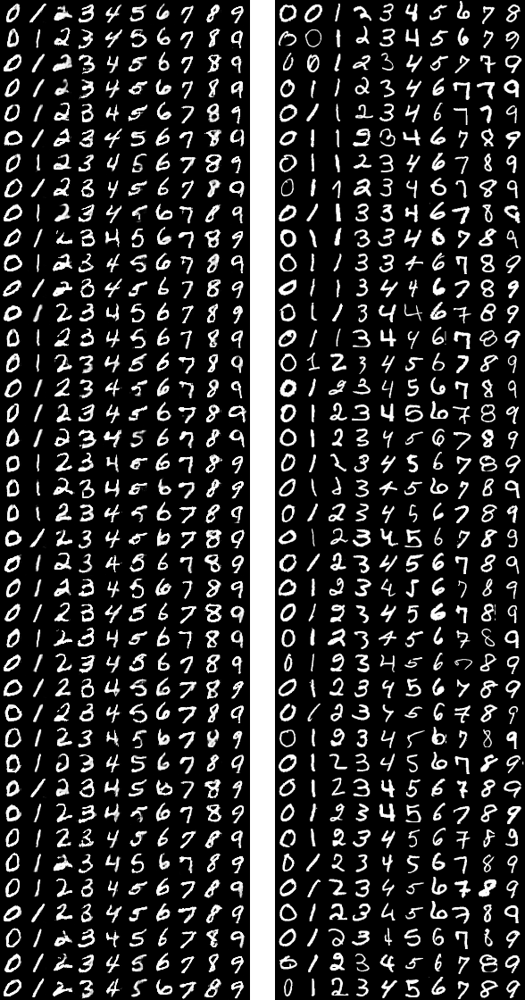

In [43]:
!ls *.png
from IPython.display import Image
Image(filename='plot_epoch_013_generated.png') 

# 2. Generate Pokemon

In [3]:
from os import path


#Instructions for getting dataset from kaggle:
# https://medium.com/@saedhussain/google-colaboratory-and-kaggle-datasets-b57a83eb6ef8
from google.colab import files
!pip install -q kaggle
#Upload your kaggle.json API file

if not path.exists("/root/.kaggle/kaggle.json"): 
  firsttime = True
  uploaded = files.upload()
  !mkdir ~/.kaggle
  !mv kaggle.json ~/.kaggle/kaggle.json
  !ls -halt ~/.kaggle
  !chmod 600 ~/.kaggle/kaggle.json

if firsttime: 
  !kaggle datasets download -d vishalsubbiah/pokemon-images-and-types

import zipfile
if not path.exists("pokemon-images-and-types"):
  with zipfile.ZipFile("pokemon-images-and-types.zip","r") as zip_ref:
    zip_ref.extractall("pokemon-images-and-types")

#!ls

Saving kaggle.json to kaggle.json
total 16K
drwxr-xr-x 2 root root 4.0K Mar 25 07:04 .
drwx------ 1 root root 4.0K Mar 25 07:04 ..
-rw-r--r-- 1 root root   64 Mar 25 07:04 kaggle.json
  0% 0.00/2.47M [00:00<?, ?B/s]
100% 2.47M/2.47M [00:00<00:00, 81.5MB/s]


In [0]:
#!ls pokemon-images-and-types/images/images

In [41]:
!ls pokemon-images-and-types

import csv
with open('pokemon-images-and-types/pokemon.csv', newline='') as csvfile:
  reader = csv.DictReader(csvfile)
  pokemons2type = {}

  for row in reader:
    pokemons2type[row['Name']] = row['Type1']
  
types_pokemon = list(set(pokemons2type.values()))
print ("Number of types:", len(types_pokemon))
print ("Types:", ", ".join(types_pokemon))

#Integer to type of pokemon mapping for categorization
int2type = {}
type2int = {}
for i in range(len(types_pokemon)):
  int2type[i] = types_pokemon[i]
  type2int[types_pokemon[i]] = i

import glob
imagepath = 'pokemon-images-and-types/images/images/'
images = glob.glob(imagepath + '*.png')

#from sklearn.datasets import fetch_openml
#imagedata = fetch_openml('Pokemon', data_home=imagepath)
#print ("type imagedata:", type(imagedata))
#print ("imagedata[0]", imagedata[0])

import cv2
import re
import sklearn.model_selection

x_data, y_data = [], []

import pprint 
pp = pprint.PrettyPrinter(indent=4)
pp.pprint(int2type)

imagesizes = set()
for i, image in enumerate(images):
  im = cv2.imread(image)
#  print ("image:", re.sub(".*\/","", image))
#  print (type(im))
  imagesizes.add(im.shape)
  x_data.append(im)
  name = re.sub(".*\/","", image)
  name = re.sub(".png", "", name)
  y_data.append(type2int[pokemons2type[name]])
  if not i: print ("First pokemon:", image)

#Don't need to categorize as script will do it later
#y_data = tensorflow.keras.utils.to_categorical(y_data)

#Check shape of images
print("imagesizes:", imagesizes)
#Check 1 image to see if it matches label
print ("x_data[0].shape", x_data[0].shape)
print ("y_data[0]:", y_data[0])

x_train, x_test, y_train, y_test = sklearn.model_selection.train_test_split(x_data, y_data)


images	pokemon.csv
Number of types: 18
Types: Steel, Grass, Water, Electric, Bug, Fighting, Flying, Dragon, Fairy, Psychic, Ghost, Ice, Fire, Normal, Poison, Ground, Rock, Dark
{   0: 'Steel',
    1: 'Grass',
    2: 'Water',
    3: 'Electric',
    4: 'Bug',
    5: 'Fighting',
    6: 'Flying',
    7: 'Dragon',
    8: 'Fairy',
    9: 'Psychic',
    10: 'Ghost',
    11: 'Ice',
    12: 'Fire',
    13: 'Normal',
    14: 'Poison',
    15: 'Ground',
    16: 'Rock',
    17: 'Dark'}
First pokemon: pokemon-images-and-types/images/images/cresselia.png
imagesizes: {(120, 120, 3)}
x_data[0].shape (120, 120, 3)
y_data[0]: 9


Discriminator model:
Model: "model_54"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_91 (InputLayer)           [(None, 120, 120, 3) 0                                            
__________________________________________________________________________________________________
sequential_36 (Sequential)      (None, 230400)       388416      input_91[0][0]                   
__________________________________________________________________________________________________
generation (Dense)              (None, 1)            230401      sequential_36[1][0]              
__________________________________________________________________________________________________
auxiliary (Dense)               (None, 18)           4147218     sequential_36[1][0]              
Total params: 4,766,035
Trainable params: 4,766,035
Non-trainable para

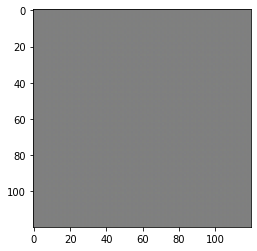

Epoch 2/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 2:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 3.15 | 0.2968          | 2.9124
generator (test)       | 7.70 | 4.7908          | 2.9061
discriminator (train)  | 2.78 | 0.1355          | 2.6466
discriminator (test)   | 2.88 | 0.1077          | 2.7758
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


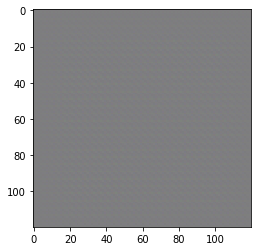

Epoch 3/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 3:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 3.10 | 0.4180          | 2.8768
generator (test)       | 8.54 | 5.6250          | 2.9214
discriminator (train)  | 2.55 | 0.1115          | 2.4480
discriminator (test)   | 2.87 | 0.0953          | 2.7853
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


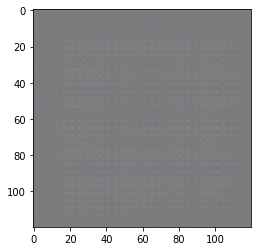

Epoch 4/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 4:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 2.97 | 0.4504          | 2.7511
generator (test)       | 8.97 | 6.0348          | 2.9265
discriminator (train)  | 2.30 | 0.1094          | 2.2106
discriminator (test)   | 2.86 | 0.0823          | 2.7984
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


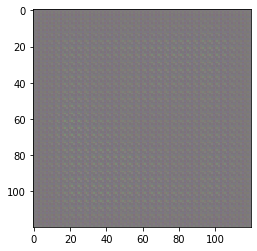

Epoch 5/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 151ms/step
Testing for epoch 5:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 2.72 | 0.4689          | 2.5040
generator (test)       | 9.43 | 6.4749          | 2.9500
discriminator (train)  | 1.99 | 0.1058          | 1.9145
discriminator (test)   | 2.88 | 0.0565          | 2.8260
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


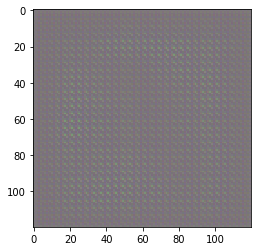

Epoch 6/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 6:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 2.12 | 0.5068          | 1.9037
generator (test)       | 9.39 | 6.4901          | 2.8979
discriminator (train)  | 1.66 | 0.1074          | 1.5905
discriminator (test)   | 3.00 | 0.0601          | 2.9387
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


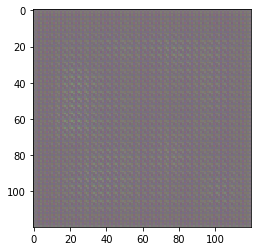

Epoch 7/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 7:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.47 | 0.5515          | 1.2280
generator (test)       | 9.61 | 6.7061          | 2.8985
discriminator (train)  | 1.31 | 0.1144          | 1.2469
discriminator (test)   | 3.08 | 0.0489          | 3.0277
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


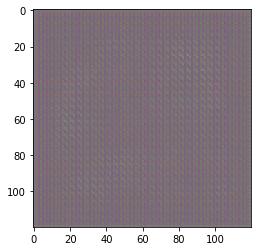

Epoch 8/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 8:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.08 | 0.6184          | 0.8225
generator (test)       | 8.65 | 5.7986          | 2.8556
discriminator (train)  | 1.02 | 0.1462          | 0.9538
discriminator (test)   | 3.13 | 0.0532          | 3.0675
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


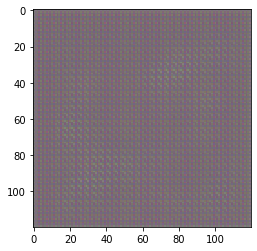

Epoch 9/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 148ms/step
Testing for epoch 9:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.77 | 0.5309          | 0.5502
generator (test)       | 9.05 | 6.3113          | 2.7453
discriminator (train)  | 0.77 | 0.1243          | 0.7380
discriminator (test)   | 3.24 | 0.0279          | 3.1891
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


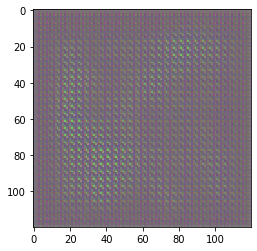

Epoch 10/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 147ms/step
Testing for epoch 10:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.65 | 0.5402          | 0.4587
generator (test)       | 8.44 | 5.7760          | 2.6775
discriminator (train)  | 0.57 | 0.1183          | 0.5507
discriminator (test)   | 3.51 | 0.0275          | 3.4312
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


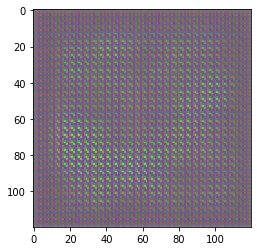

Epoch 11/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 148ms/step
Testing for epoch 11:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.58 | 0.5781          | 0.3318
generator (test)       | 9.19 | 6.6043          | 2.5809
discriminator (train)  | 0.45 | 0.1422          | 0.4266
discriminator (test)   | 3.55 | 0.0162          | 3.4724
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


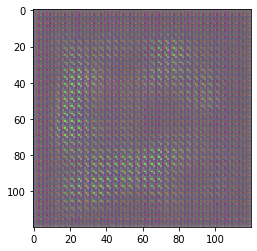

Epoch 12/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 148ms/step
Testing for epoch 12:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.47 | 0.5926          | 0.2417
generator (test)       | 7.74 | 5.2690          | 2.4670
discriminator (train)  | 0.37 | 0.1238          | 0.3750
discriminator (test)   | 3.65 | 0.0167          | 3.5648
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


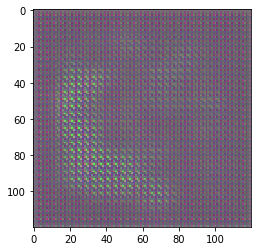

Epoch 13/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 13:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.54 | 0.5227          | 0.3198
generator (test)       | 6.45 | 4.2876          | 2.1546
discriminator (train)  | 0.29 | 0.1317          | 0.2974
discriminator (test)   | 3.78 | 0.0109          | 3.6814
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


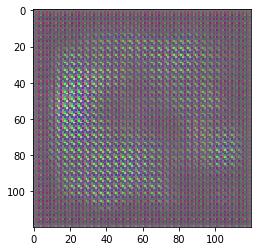

Epoch 14/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 14:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.64 | 0.5528          | 0.3257
generator (test)       | 7.49 | 5.3609          | 2.1303
discriminator (train)  | 0.31 | 0.1782          | 0.2692
discriminator (test)   | 3.72 | 0.0214          | 3.6113
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


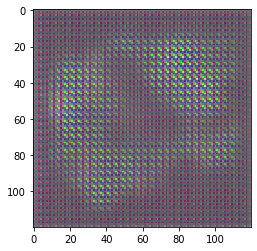

Epoch 15/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 147ms/step
Testing for epoch 15:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.43 | 0.4996          | 0.2237
generator (test)       | 6.26 | 4.3629          | 1.8979
discriminator (train)  | 0.22 | 0.1356          | 0.2312
discriminator (test)   | 3.68 | 0.0206          | 3.5606
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


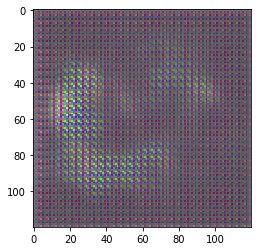

Epoch 16/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 16:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.40 | 0.4574          | 0.1865
generator (test)       | 4.55 | 3.2378          | 1.2900
discriminator (train)  | 0.18 | 0.1272          | 0.1973
discriminator (test)   | 3.56 | 0.0264          | 3.3897
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


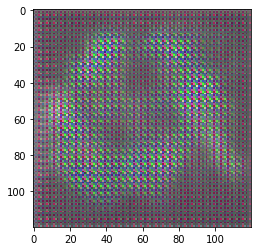

Epoch 17/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 17:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.51 | 0.4482          | 0.2200
generator (test)       | 7.47 | 6.0967          | 1.3876
discriminator (train)  | 0.17 | 0.1310          | 0.1777
discriminator (test)   | 3.76 | 0.1090          | 3.5285
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


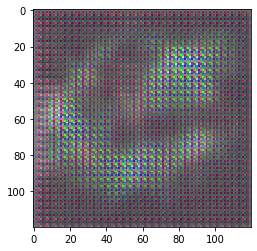

Epoch 18/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 18:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.45 | 0.5623          | 0.1811
generator (test)       | 7.27 | 6.6023          | 0.6682
discriminator (train)  | 0.18 | 0.1405          | 0.1796
discriminator (test)   | 3.47 | 0.0892          | 3.2154
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


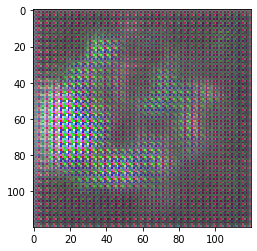

Epoch 19/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 19:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.46 | 0.5837          | 0.1585
generator (test)       | 7.57 | 6.8077          | 0.7719
discriminator (train)  | 0.17 | 0.1400          | 0.1638
discriminator (test)   | 3.37 | 0.0985          | 3.1088
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


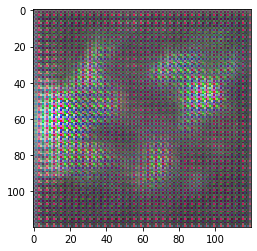

Epoch 20/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 20:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.41 | 0.5443          | 0.1680
generator (test)       | 6.83 | 6.2917          | 0.5449
discriminator (train)  | 0.14 | 0.1194          | 0.1540
discriminator (test)   | 3.43 | 0.1082          | 3.1545
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


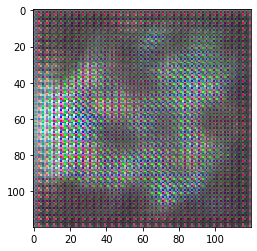

Epoch 21/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 151ms/step
Testing for epoch 21:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.54 | 0.6212          | 0.1880
generator (test)       | 6.72 | 6.4029          | 0.3163
discriminator (train)  | 0.15 | 0.1274          | 0.1506
discriminator (test)   | 3.33 | 0.0732          | 3.0874
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


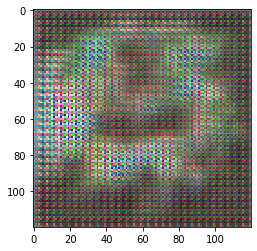

Epoch 22/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 22:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 17.21 | 13.0299         | 4.4354
generator (test)       | 6.64 | 1.2764          | 5.4140
discriminator (train)  | 3.34 | 2.5621          | 0.9077
discriminator (test)   | 7.02 | 1.1162          | 5.7821
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


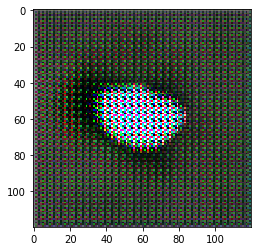

Epoch 23/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 154ms/step
Testing for epoch 23:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 3.97 | 0.6119          | 3.3180
generator (test)       | 7.84 | 4.3425          | 3.5033
discriminator (train)  | 0.74 | 0.2922          | 0.6208
discriminator (test)   | 4.06 | 0.1153          | 3.9509
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


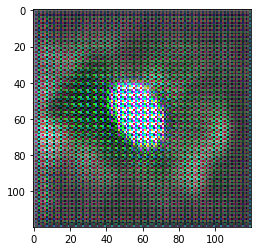

Epoch 24/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 152ms/step
Testing for epoch 24:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.20 | 0.4094          | 1.0064
generator (test)       | 6.92 | 5.1649          | 1.7319
discriminator (train)  | 0.24 | 0.1466          | 0.2538
discriminator (test)   | 3.36 | 0.1059          | 3.1841
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


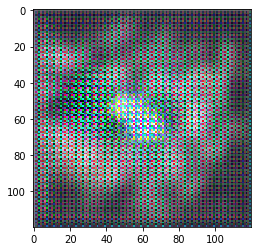

Epoch 25/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 25:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.47 | 0.4443          | 0.2895
generator (test)       | 6.13 | 5.3822          | 0.7577
discriminator (train)  | 0.19 | 0.1290          | 0.1885
discriminator (test)   | 3.00 | 0.1236          | 2.7328
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


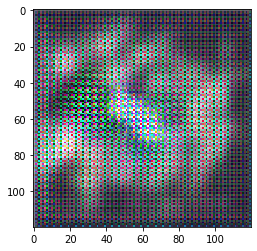

Epoch 26/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 26:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.34 | 0.4548          | 0.1218
generator (test)       | 6.10 | 5.3402          | 0.8021
discriminator (train)  | 0.16 | 0.1238          | 0.1522
discriminator (test)   | 3.11 | 0.1323          | 2.8282
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


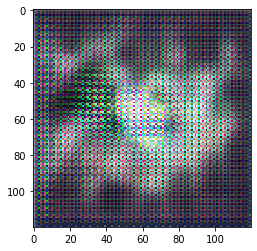

Epoch 27/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 27:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.34 | 0.4568          | 0.1269
generator (test)       | 6.03 | 5.6857          | 0.3703
discriminator (train)  | 0.15 | 0.1224          | 0.1461
discriminator (test)   | 2.99 | 0.0823          | 2.7561
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


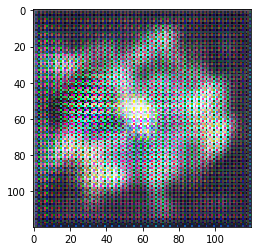

Epoch 28/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 28:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.40 | 0.4766          | 0.1582
generator (test)       | 6.35 | 5.9968          | 0.3603
discriminator (train)  | 0.14 | 0.1170          | 0.1373
discriminator (test)   | 3.02 | 0.0809          | 2.7843
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


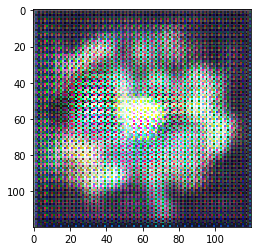

Epoch 29/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 29:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.47 | 0.5093          | 0.2108
generator (test)       | 3.07 | 2.7234          | 0.3123
discriminator (train)  | 0.14 | 0.1177          | 0.1364
discriminator (test)   | 3.12 | 0.1176          | 2.8494
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


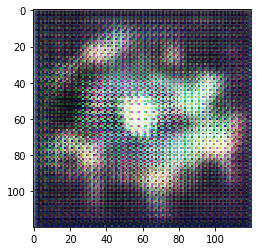

Epoch 30/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 30:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 12.19 | 9.5979          | 2.6946
generator (test)       | 3.84 | 1.5726          | 2.2542
discriminator (train)  | 1.04 | 0.9628          | 0.1912
discriminator (test)   | 3.70 | 0.4798          | 3.1629
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


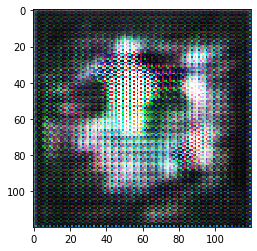

Epoch 31/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 31:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 4.87 | 3.0077          | 1.9169
generator (test)       | 2.39 | 0.2698          | 2.1139
discriminator (train)  | 0.67 | 0.5616          | 0.2485
discriminator (test)   | 4.18 | 1.0863          | 3.0327
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


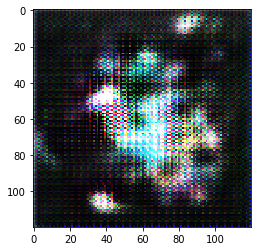

Epoch 32/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 151ms/step
Testing for epoch 32:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.97 | 0.2782          | 0.6289
generator (test)       | 5.46 | 4.7187          | 0.7217
discriminator (train)  | 0.32 | 0.2738          | 0.2049
discriminator (test)   | 2.46 | 0.0144          | 2.3365
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


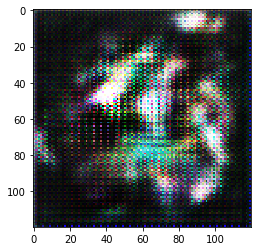

Epoch 33/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 33:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.30 | 0.4141          | 0.0980
generator (test)       | 4.89 | 4.5402          | 0.3805
discriminator (train)  | 0.16 | 0.1173          | 0.1385
discriminator (test)   | 2.43 | 0.0181          | 2.2701
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


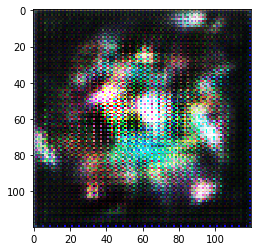

Epoch 34/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 34:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.27 | 0.4048          | 0.0632
generator (test)       | 4.73 | 4.5743          | 0.1608
discriminator (train)  | 0.15 | 0.1143          | 0.1220
discriminator (test)   | 2.42 | 0.0193          | 2.2888
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


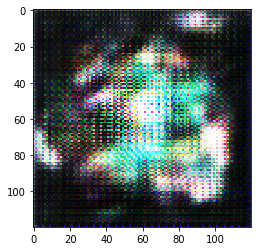

Epoch 35/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 151ms/step
Testing for epoch 35:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.27 | 0.4160          | 0.0373
generator (test)       | 3.19 | 3.0313          | 0.1337
discriminator (train)  | 0.14 | 0.1159          | 0.1167
discriminator (test)   | 2.59 | 0.0798          | 2.3706
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


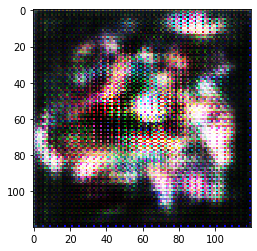

Epoch 36/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 151ms/step
Testing for epoch 36:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 8.50 | 7.7787          | 0.8419
generator (test)       | 77.85 | 67.9162         | 9.9581
discriminator (train)  | 0.43 | 0.4125          | 0.1189
discriminator (test)   | 8.65 | 0.8841          | 8.0708
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


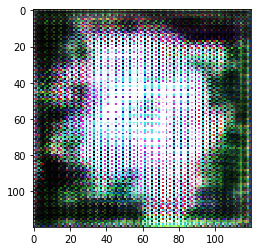

Epoch 37/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 151ms/step
Testing for epoch 37:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 5.00 | 4.5794          | 2.6663
generator (test)       | 1.85 | 0.6728          | 1.1418
discriminator (train)  | 0.89 | 0.7095          | 0.5318
discriminator (test)   | 3.38 | 0.7282          | 2.5739
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


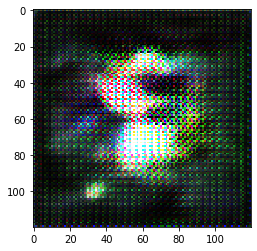

Epoch 38/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 152ms/step
Testing for epoch 38:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 3.45 | 2.4625          | 0.8740
generator (test)       | 3.45 | 2.0446          | 1.3971
discriminator (train)  | 0.52 | 0.4740          | 0.1703
discriminator (test)   | 2.85 | 0.1530          | 2.6481
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


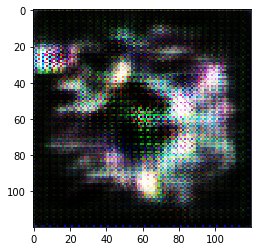

Epoch 39/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 39:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.42 | 0.3180          | 0.2161
generator (test)       | 4.56 | 4.1231          | 0.4146
discriminator (train)  | 0.21 | 0.1595          | 0.1563
discriminator (test)   | 2.41 | 0.0260          | 2.3233
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


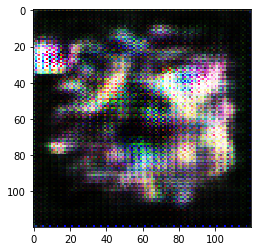

Epoch 40/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 40:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.29 | 0.4058          | 0.0607
generator (test)       | 4.17 | 3.9093          | 0.2517
discriminator (train)  | 0.15 | 0.1187          | 0.1270
discriminator (test)   | 2.43 | 0.0331          | 2.2709
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


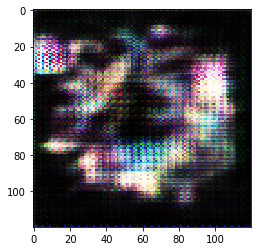

Epoch 41/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 152ms/step
Testing for epoch 41:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 8.93 | 8.3086          | 0.7840
generator (test)       | 2.56 | 0.0027          | 2.5592
discriminator (train)  | 0.53 | 0.4934          | 0.1226
discriminator (test)   | 7.29 | 3.9322          | 3.4729
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


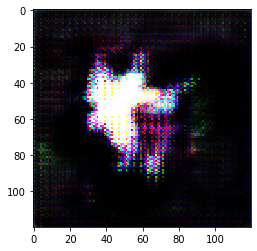

Epoch 42/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 148ms/step
Testing for epoch 42:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 4.81 | 3.1183          | 1.1272
generator (test)       | 3.83 | 2.2852          | 1.4848
discriminator (train)  | 0.86 | 0.8544          | 0.2054
discriminator (test)   | 2.99 | 0.4684          | 2.4520
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


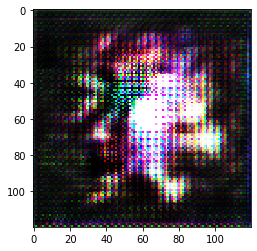

Epoch 43/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 43:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 3.81 | 2.9689          | 0.7805
generator (test)       | 1.12 | 0.3788          | 0.7640
discriminator (train)  | 0.58 | 0.5222          | 0.1702
discriminator (test)   | 3.67 | 1.4890          | 2.1558
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


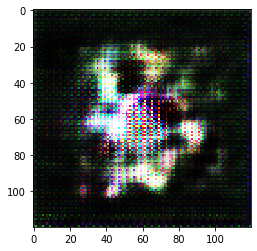

Epoch 44/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 44:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 5.59 | 4.4741          | 0.8176
generator (test)       | 1.07 | 0.0856          | 1.0389
discriminator (train)  | 0.66 | 0.6237          | 0.1573
discriminator (test)   | 4.31 | 1.9412          | 2.3497
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


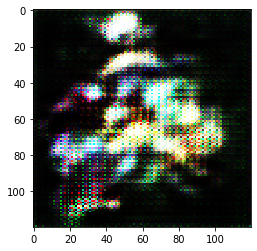

Epoch 45/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 45:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 6.69 | 4.6974          | 1.1240
generator (test)       | 5.78 | 3.8029          | 1.9131
discriminator (train)  | 0.68 | 0.6625          | 0.1519
discriminator (test)   | 3.43 | 0.2079          | 3.1322
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


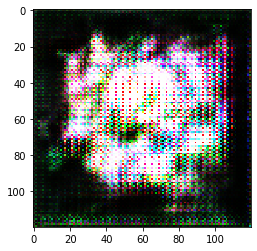

Epoch 46/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 4s 177ms/step
Testing for epoch 46:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.64 | 0.6428          | 0.2123
generator (test)       | 1.14 | 0.9097          | 0.2519
discriminator (train)  | 0.32 | 0.2752          | 0.1757
discriminator (test)   | 2.62 | 0.5627          | 1.9448
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


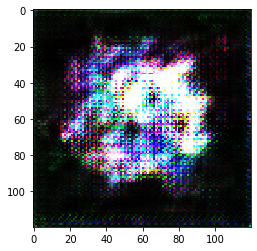

Epoch 47/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 47:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 2.71 | 2.2005          | 0.4326
generator (test)       | 1.41 | 0.9025          | 0.4935
discriminator (train)  | 0.73 | 0.6980          | 0.1246
discriminator (test)   | 2.54 | 0.3859          | 2.0776
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


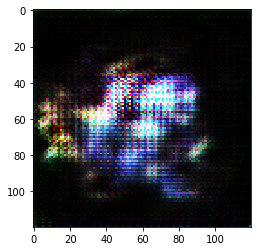

Epoch 48/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 48:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 4.97 | 4.4895          | 0.5182
generator (test)       | 1.36 | 0.1693          | 1.1500
discriminator (train)  | 0.61 | 0.5658          | 0.1316
discriminator (test)   | 4.30 | 1.7636          | 2.5181
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


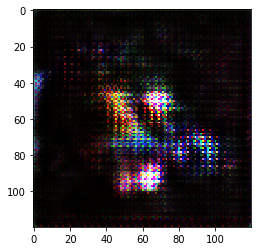

Epoch 49/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 151ms/step
Testing for epoch 49:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 2.99 | 2.3675          | 0.5126
generator (test)       | 0.81 | 0.1256          | 0.6836
discriminator (train)  | 0.87 | 0.8526          | 0.1678
discriminator (test)   | 3.41 | 1.3063          | 2.0408
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


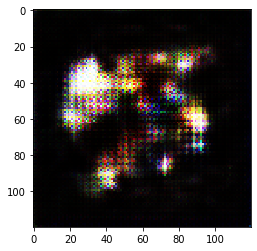

Epoch 50/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 151ms/step
Testing for epoch 50:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 4.85 | 4.0257          | 0.7136
generator (test)       | 1.49 | 0.2576          | 1.2551
discriminator (train)  | 0.93 | 0.8863          | 0.1571
discriminator (test)   | 3.81 | 1.3805          | 2.4343
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


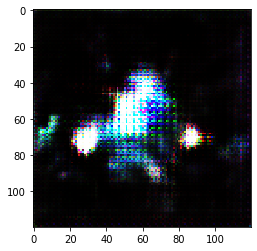

Epoch 51/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 152ms/step
Testing for epoch 51:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 2.63 | 2.1000          | 0.4460
generator (test)       | 0.31 | 0.1517          | 0.1543
discriminator (train)  | 0.87 | 0.8087          | 0.1886
discriminator (test)   | 3.01 | 1.2109          | 1.7554
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


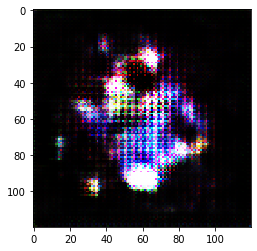

Epoch 52/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 52:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 2.01 | 1.6503          | 0.3007
generator (test)       | 1.11 | 0.3130          | 0.7762
discriminator (train)  | 0.75 | 0.7060          | 0.1396
discriminator (test)   | 3.26 | 1.1036          | 2.1768
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


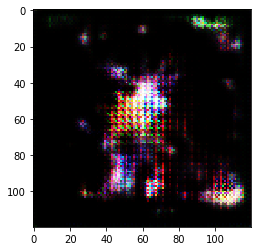

Epoch 53/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 151ms/step
Testing for epoch 53:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.42 | 0.2490          | 0.1372
generator (test)       | 6.20 | 5.7608          | 0.3966
discriminator (train)  | 0.25 | 0.2183          | 0.1413
discriminator (test)   | 2.24 | 0.0254          | 2.1010
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


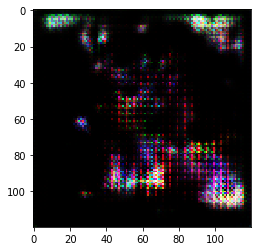

Epoch 54/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 151ms/step
Testing for epoch 54:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.25 | 0.4639          | 0.0311
generator (test)       | 5.86 | 5.7467          | 0.1030
discriminator (train)  | 0.15 | 0.1142          | 0.1133
discriminator (test)   | 2.20 | 0.0285          | 2.0494
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


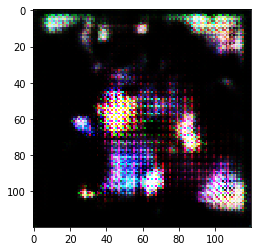

Epoch 55/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 152ms/step
Testing for epoch 55:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.24 | 0.4609          | 0.0185
generator (test)       | 5.21 | 5.1693          | 0.0542
discriminator (train)  | 0.14 | 0.1116          | 0.1047
discriminator (test)   | 2.26 | 0.0334          | 2.0991
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


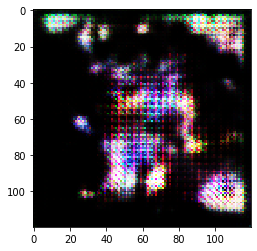

Epoch 56/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 56:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.05 | 1.2216          | 0.0346
generator (test)       | 2.23 | 0.1473          | 2.1101
discriminator (train)  | 0.14 | 0.1246          | 0.1026
discriminator (test)   | 5.07 | 1.6269          | 3.4176
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


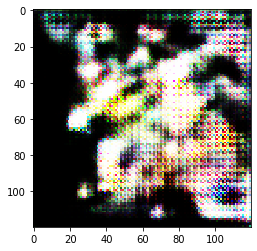

Epoch 57/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 151ms/step
Testing for epoch 57:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 3.02 | 1.2364          | 0.1984
generator (test)       | 2.73 | 2.1996          | 0.5154
discriminator (train)  | 0.42 | 0.4332          | 0.1657
discriminator (test)   | 2.45 | 0.1654          | 2.1557
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


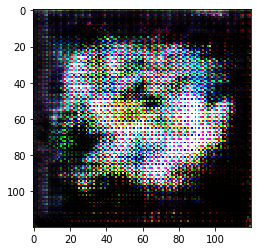

Epoch 58/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 58:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 0.32 | 0.3749          | 0.0504
generator (test)       | 1.63 | 1.4667          | 0.1552
discriminator (train)  | 0.22 | 0.1931          | 0.1128
discriminator (test)   | 2.42 | 0.2441          | 2.0502
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


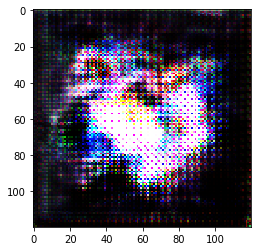

Epoch 59/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 59:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.49 | 1.4043          | 0.1307
generator (test)       | 0.69 | 0.0487          | 0.6356
discriminator (train)  | 0.41 | 0.3937          | 0.1069
discriminator (test)   | 4.12 | 1.8723          | 2.2638
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


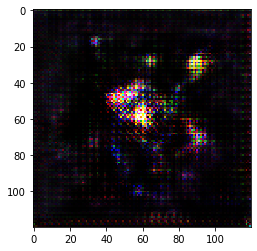

Epoch 60/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 60:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.41 | 1.0531          | 0.2000
generator (test)       | 0.44 | 0.3059          | 0.1379
discriminator (train)  | 0.40 | 0.4269          | 0.1193
discriminator (test)   | 2.92 | 0.8847          | 1.9489
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


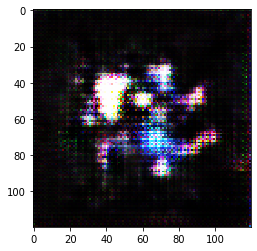

Epoch 61/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 61:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.75 | 1.4970          | 0.2150
generator (test)       | 1.38 | 1.1506          | 0.2489
discriminator (train)  | 0.62 | 0.6252          | 0.1031
discriminator (test)   | 2.53 | 0.4946          | 1.9175
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


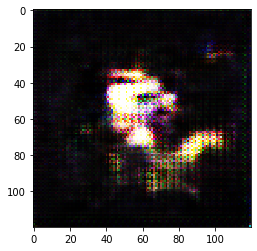

Epoch 62/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 62:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.76 | 1.5456          | 0.2456
generator (test)       | 1.10 | 0.8542          | 0.2458
discriminator (train)  | 0.58 | 0.5452          | 0.1074
discriminator (test)   | 2.56 | 0.5556          | 1.9411
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


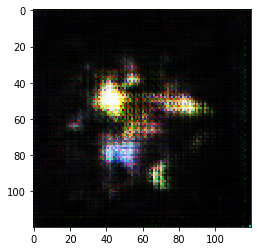

Epoch 63/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 63:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.83 | 1.5825          | 0.2434
generator (test)       | 0.65 | 0.5217          | 0.1239
discriminator (train)  | 0.67 | 0.6474          | 0.1071
discriminator (test)   | 2.79 | 0.8633          | 1.8531
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


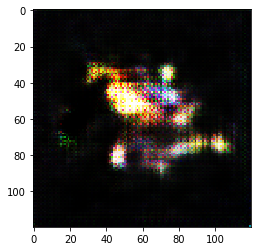

Epoch 64/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 148ms/step
Testing for epoch 64:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.86 | 1.5482          | 0.2652
generator (test)       | 1.27 | 1.1469          | 0.1163
discriminator (train)  | 0.62 | 0.6019          | 0.1067
discriminator (test)   | 2.49 | 0.5511          | 1.8441
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


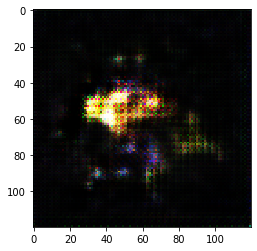

Epoch 65/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 65:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.82 | 1.5715          | 0.2681
generator (test)       | 1.11 | 0.9944          | 0.1071
discriminator (train)  | 0.65 | 0.6113          | 0.1068
discriminator (test)   | 2.52 | 0.5798          | 1.8478
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


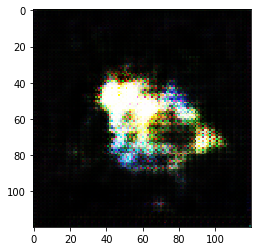

Epoch 66/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 151ms/step
Testing for epoch 66:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.78 | 1.5848          | 0.2050
generator (test)       | 1.60 | 0.9198          | 0.6975
discriminator (train)  | 0.64 | 0.6054          | 0.1066
discriminator (test)   | 3.03 | 0.7601          | 2.1897
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


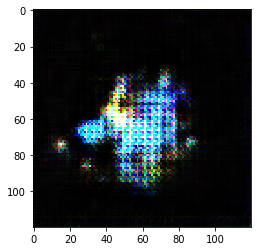

Epoch 67/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 67:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.86 | 1.5523          | 0.2854
generator (test)       | 0.73 | 0.5301          | 0.1926
discriminator (train)  | 0.60 | 0.5742          | 0.1162
discriminator (test)   | 2.66 | 0.6590          | 1.9240
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


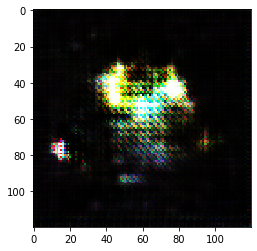

Epoch 68/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 68:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.70 | 1.4590          | 0.1879
generator (test)       | 0.83 | 0.4899          | 0.3443
discriminator (train)  | 0.62 | 0.6077          | 0.1025
discriminator (test)   | 2.82 | 0.7612          | 1.9877
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


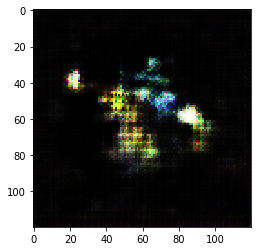

Epoch 69/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 69:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.58 | 1.3416          | 0.1793
generator (test)       | 1.36 | 1.3101          | 0.0332
discriminator (train)  | 0.59 | 0.5743          | 0.1053
discriminator (test)   | 2.37 | 0.3407          | 1.9077
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


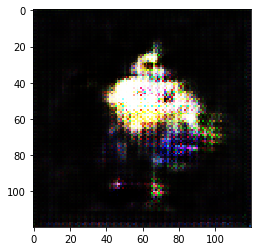

Epoch 70/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 148ms/step
Testing for epoch 70:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.56 | 1.3831          | 0.1995
generator (test)       | 0.79 | 0.5739          | 0.2043
discriminator (train)  | 0.57 | 0.5481          | 0.1021
discriminator (test)   | 2.57 | 0.6497          | 1.8526
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


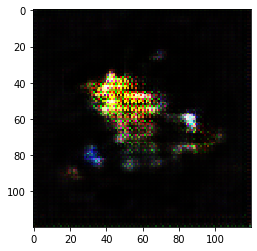

Epoch 71/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 71:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.57 | 1.3647          | 0.1743
generator (test)       | 1.13 | 0.9899          | 0.1343
discriminator (train)  | 0.65 | 0.6196          | 0.1010
discriminator (test)   | 2.48 | 0.5495          | 1.8205
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


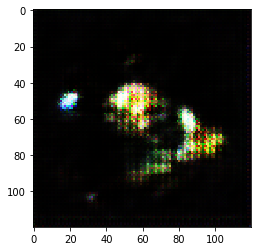

Epoch 72/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 72:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.72 | 1.5202          | 0.2012
generator (test)       | 1.43 | 1.2285          | 0.1960
discriminator (train)  | 0.67 | 0.6355          | 0.1005
discriminator (test)   | 2.59 | 0.6052          | 1.8683
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


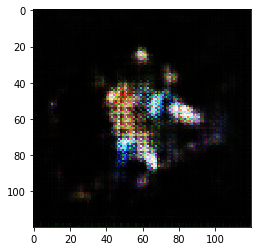

Epoch 73/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 73:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.63 | 1.4659          | 0.1793
generator (test)       | 0.55 | 0.3768          | 0.1618
discriminator (train)  | 0.66 | 0.6326          | 0.1021
discriminator (test)   | 2.84 | 0.9427          | 1.8365
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


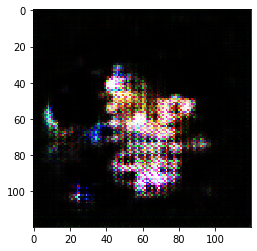

Epoch 74/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 74:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.81 | 1.5320          | 0.1924
generator (test)       | 0.64 | 0.4524          | 0.1836
discriminator (train)  | 0.69 | 0.6641          | 0.1016
discriminator (test)   | 2.77 | 0.8468          | 1.8553
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


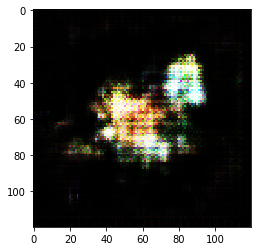

Epoch 75/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 148ms/step
Testing for epoch 75:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.74 | 1.4979          | 0.2055
generator (test)       | 3.01 | 2.8343          | 0.1837
discriminator (train)  | 0.71 | 0.6907          | 0.1024
discriminator (test)   | 2.93 | 0.9899          | 1.7865
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


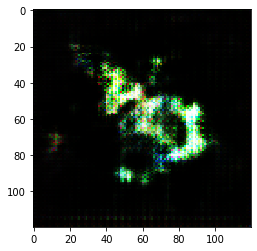

Epoch 76/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 148ms/step
Testing for epoch 76:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.41 | 1.3236          | 0.1804
generator (test)       | 1.29 | 1.1284          | 0.1488
discriminator (train)  | 0.75 | 0.7039          | 0.1049
discriminator (test)   | 2.40 | 0.4935          | 1.8012
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


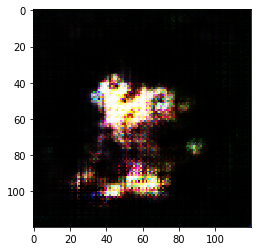

Epoch 77/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 77:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.50 | 1.3202          | 0.1621
generator (test)       | 1.66 | 1.3906          | 0.2749
discriminator (train)  | 0.71 | 0.6840          | 0.1069
discriminator (test)   | 2.78 | 0.7472          | 1.9220
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


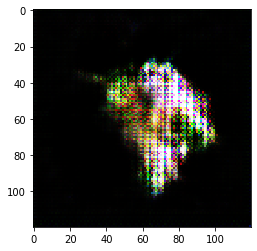

Epoch 78/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 148ms/step
Testing for epoch 78:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.66 | 1.5355          | 0.1529
generator (test)       | 0.59 | 0.4528          | 0.1385
discriminator (train)  | 0.71 | 0.6779          | 0.1065
discriminator (test)   | 2.63 | 0.7704          | 1.7732
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


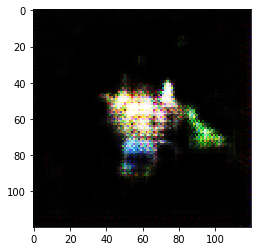

Epoch 79/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 148ms/step
Testing for epoch 79:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.65 | 1.4457          | 0.1598
generator (test)       | 1.98 | 1.8524          | 0.1379
discriminator (train)  | 0.69 | 0.6708          | 0.1019
discriminator (test)   | 2.57 | 0.6039          | 1.8431
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


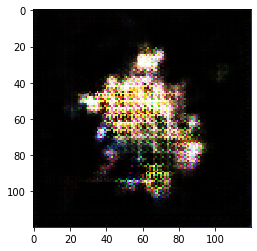

Epoch 80/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 80:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.59 | 1.4243          | 0.2129
generator (test)       | 1.59 | 1.4910          | 0.0991
discriminator (train)  | 0.72 | 0.6812          | 0.1032
discriminator (test)   | 2.56 | 0.6949          | 1.7420
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


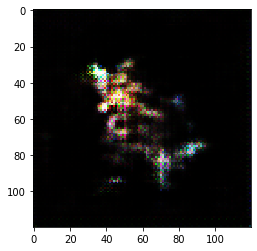

Epoch 81/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 81:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.64 | 1.5169          | 0.1527
generator (test)       | 0.72 | 0.5392          | 0.1943
discriminator (train)  | 0.69 | 0.6572          | 0.1003
discriminator (test)   | 2.58 | 0.7220          | 1.7682
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


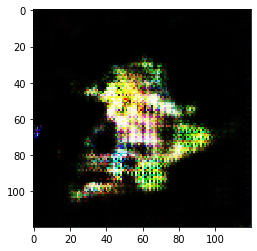

Epoch 82/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 151ms/step
Testing for epoch 82:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.80 | 1.5303          | 0.2093
generator (test)       | 1.69 | 1.4706          | 0.2279
discriminator (train)  | 0.72 | 0.6956          | 0.1033
discriminator (test)   | 2.79 | 0.7702          | 1.8926
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


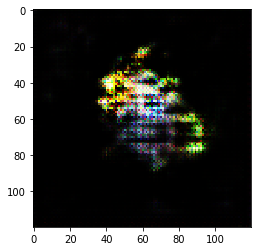

Epoch 83/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 151ms/step
Testing for epoch 83:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.64 | 1.5031          | 0.1636
generator (test)       | 2.86 | 1.8932          | 0.9506
discriminator (train)  | 0.65 | 0.6237          | 0.1039
discriminator (test)   | 2.93 | 0.5139          | 2.3219
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


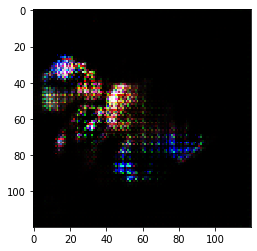

Epoch 84/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 151ms/step
Testing for epoch 84:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.73 | 1.5942          | 0.2122
generator (test)       | 2.52 | 1.3912          | 1.1366
discriminator (train)  | 0.78 | 0.7479          | 0.1229
discriminator (test)   | 3.05 | 0.5756          | 2.4025
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


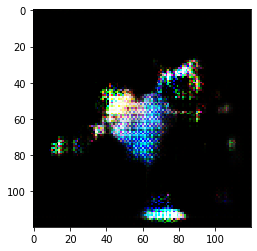

Epoch 85/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 85:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 2.84 | 2.6480          | 0.2769
generator (test)       | 0.37 | 0.2143          | 0.1517
discriminator (train)  | 0.60 | 0.5821          | 0.1202
discriminator (test)   | 3.48 | 1.2642          | 2.1215
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


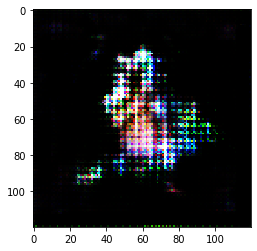

Epoch 86/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 86:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.40 | 1.1241          | 0.1542
generator (test)       | 0.83 | 0.6764          | 0.1535
discriminator (train)  | 0.62 | 0.5943          | 0.1116
discriminator (test)   | 2.71 | 0.6756          | 1.9391
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


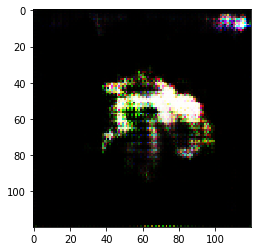

Epoch 87/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 147ms/step
Testing for epoch 87:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 2.51 | 2.2023          | 0.2199
generator (test)       | 1.51 | 1.3585          | 0.1392
discriminator (train)  | 0.50 | 0.4827          | 0.0991
discriminator (test)   | 2.47 | 0.3808          | 1.9788
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


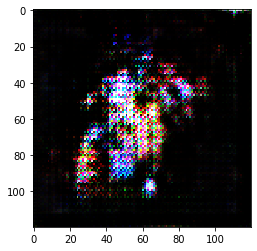

Epoch 88/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 148ms/step
Testing for epoch 88:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.19 | 1.0892          | 0.1352
generator (test)       | 0.84 | 0.7132          | 0.1242
discriminator (train)  | 0.47 | 0.4544          | 0.1009
discriminator (test)   | 2.53 | 0.4754          | 1.9503
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


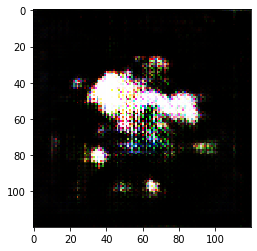

Epoch 89/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 148ms/step
Testing for epoch 89:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.73 | 1.5526          | 0.1245
generator (test)       | 1.80 | 1.5268          | 0.2535
discriminator (train)  | 0.67 | 0.6532          | 0.1001
discriminator (test)   | 2.85 | 0.7367          | 1.9800
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


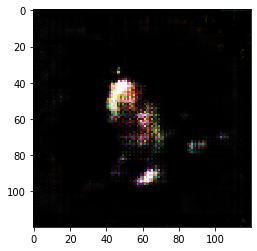

Epoch 90/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 90:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.76 | 1.6456          | 0.1678
generator (test)       | 0.70 | 0.3185          | 0.3882
discriminator (train)  | 0.85 | 0.8185          | 0.1057
discriminator (test)   | 2.91 | 0.9953          | 1.8312
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


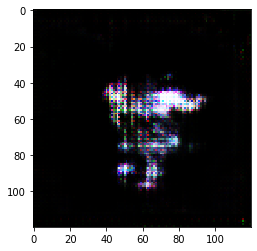

Epoch 91/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 148ms/step
Testing for epoch 91:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.52 | 1.3115          | 0.1429
generator (test)       | 1.22 | 0.9441          | 0.2836
discriminator (train)  | 0.58 | 0.5743          | 0.0979
discriminator (test)   | 2.55 | 0.5949          | 1.8608
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


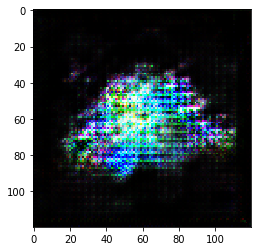

Epoch 92/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 4s 175ms/step
Testing for epoch 92:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.30 | 1.2070          | 0.0959
generator (test)       | 2.12 | 2.0324          | 0.0673
discriminator (train)  | 0.61 | 0.5832          | 0.1025
discriminator (test)   | 2.72 | 0.7185          | 1.8643
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


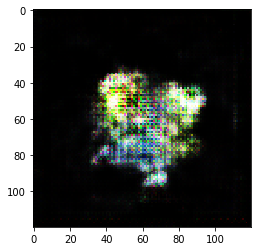

Epoch 93/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 93:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.33 | 1.2953          | 0.0969
generator (test)       | 2.09 | 1.9636          | 0.1200
discriminator (train)  | 0.58 | 0.5571          | 0.0961
discriminator (test)   | 2.80 | 0.7627          | 1.8905
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


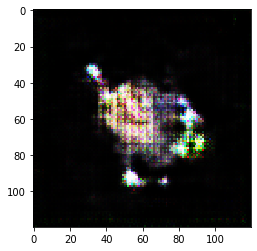

Epoch 94/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 94:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.41 | 1.3881          | 0.0928
generator (test)       | 1.68 | 1.5016          | 0.1800
discriminator (train)  | 0.58 | 0.5630          | 0.0949
discriminator (test)   | 2.85 | 0.8014          | 1.9085
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


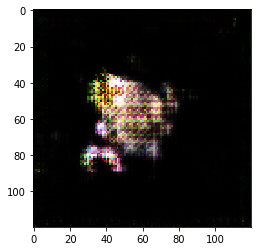

Epoch 95/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 148ms/step
Testing for epoch 95:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.46 | 1.4075          | 0.1013
generator (test)       | 1.61 | 1.3996          | 0.1900
discriminator (train)  | 0.76 | 0.7436          | 0.0985
discriminator (test)   | 2.79 | 0.8407          | 1.8171
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


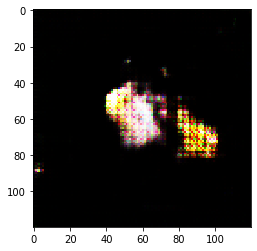

Epoch 96/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 96:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.59 | 1.5149          | 0.1109
generator (test)       | 0.90 | 0.7914          | 0.1045
discriminator (train)  | 0.70 | 0.6794          | 0.0959
discriminator (test)   | 2.55 | 0.6114          | 1.8500
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


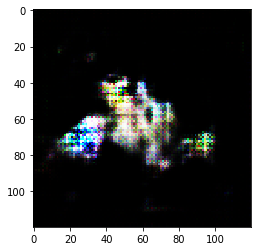

Epoch 97/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 150ms/step
Testing for epoch 97:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.55 | 1.3988          | 0.1013
generator (test)       | 1.91 | 1.7992          | 0.1103
discriminator (train)  | 0.64 | 0.6211          | 0.0964
discriminator (test)   | 2.70 | 0.7527          | 1.8135
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


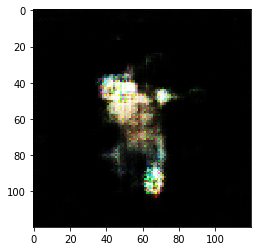

Epoch 98/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 98:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.50 | 1.4404          | 0.1195
generator (test)       | 1.58 | 1.5254          | 0.0507
discriminator (train)  | 0.62 | 0.6087          | 0.0952
discriminator (test)   | 2.57 | 0.6366          | 1.8052
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


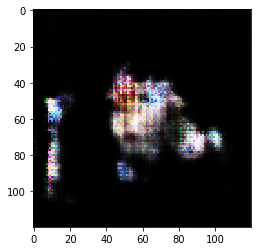

Epoch 99/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 149ms/step
Testing for epoch 99:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.56 | 1.4672          | 0.1169
generator (test)       | 1.96 | 1.9244          | 0.0432
discriminator (train)  | 0.65 | 0.6307          | 0.0939
discriminator (test)   | 2.51 | 0.5977          | 1.7826
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


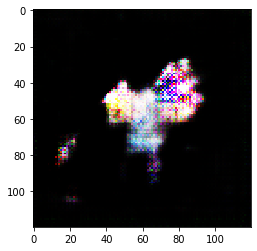

Epoch 100/100
x_train size for image_batch: (540, 120, 120, 3)
22/22 [==============================] - 3s 148ms/step
Testing for epoch 100:
component              | loss | generation_loss | auxiliary_loss
-----------------------------------------------------------------
generator (train)      | 1.45 | 1.4055          | 0.0887
generator (test)       | 2.03 | 1.8676          | 0.1425
discriminator (train)  | 0.63 | 0.6181          | 0.0930
discriminator (test)   | 2.77 | 0.7691          | 1.8594
x_train real_images shape: (540, 120, 120, 3)
img shape: (370, 120, 120, 3)
np.split(img, 2 * num_classes + 1)[0].shape (10, 120, 120, 3)
shape img: (1200, 4440, 3)


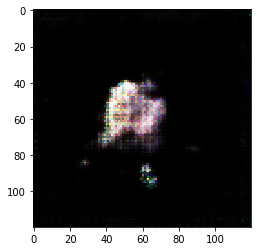

In [42]:
from __future__ import print_function

from collections import defaultdict
try:
    import cPickle as pickle
except ImportError:
    import pickle
from PIL import Image

from six.moves import range

import tensorflow
from tensorflow.keras.datasets import mnist
from tensorflow.keras import layers
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Embedding, Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import Conv2DTranspose, Conv2D
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import Progbar
import numpy as np

np.random.seed(1337)
num_classes = len(types_pokemon)


def build_generator(latent_size):
    # we will map a pair of (z, L), where z is a latent vector and L is a
    # label drawn from P_c, to image space (..., 28, 28, 1)
    cnn = Sequential()

    #cnn.add(Dense(3 * 3 * 384, input_dim=latent_size, activation='relu'))
    #cnn.add(Reshape((3, 3, 384)))
    cnn.add(Dense(26 * 26 * 384, input_dim=latent_size, activation='relu'))
    cnn.add(Reshape((26, 26, 384)))

    # upsample to (7, 7, ...)
    # upsample to (30, 30, 3)
    cnn.add(Conv2DTranspose(192, 5, strides=1, padding='valid',
                            activation='relu',
                            kernel_initializer='glorot_normal'))
    cnn.add(BatchNormalization())

    # upsample to (14, 14, ...)
    # upsample to (60, 60, 3)
    cnn.add(Conv2DTranspose(96, 5, strides=2, padding='same',
                            activation='relu',
                            kernel_initializer='glorot_normal'))
    cnn.add(BatchNormalization())

    # upsample to (28, 28, ...)
    # upsample to (120, 120, 3)
    cnn.add(Conv2DTranspose(3, 5, strides=2, padding='same',
                            activation='tanh',
                            kernel_initializer='glorot_normal'))

    # this is the z space commonly referred to in GAN papers
    latent = Input(shape=(latent_size, ))

    # this will be our label
    image_class = Input(shape=(1,), dtype='int32')

    cls = Embedding(num_classes, latent_size,
                    embeddings_initializer='glorot_normal')(image_class)

    # hadamard product between z-space and a class conditional embedding
    h = layers.multiply([latent, cls])

    fake_image = cnn(h)

    return Model([latent, image_class], fake_image)


def build_discriminator():
    # build a relatively standard conv net, with LeakyReLUs as suggested in
    # the reference paper
    cnn = Sequential()

    cnn.add(Conv2D(32, 3, padding='same', strides=2,
                   input_shape=(120, 120, 3)))
    cnn.add(LeakyReLU(0.2))
    cnn.add(Dropout(0.3))

    cnn.add(Conv2D(64, 3, padding='same', strides=1))
    cnn.add(LeakyReLU(0.2))
    cnn.add(Dropout(0.3))

    cnn.add(Conv2D(128, 3, padding='same', strides=2))
    cnn.add(LeakyReLU(0.2))
    cnn.add(Dropout(0.3))

    cnn.add(Conv2D(256, 3, padding='same', strides=1))
    cnn.add(LeakyReLU(0.2))
    cnn.add(Dropout(0.3))

    cnn.add(Flatten())

    image = Input(shape=(120, 120, 3))

    features = cnn(image)

    # first output (name=generation) is whether or not the discriminator
    # thinks the image that is being shown is fake, and the second output
    # (name=auxiliary) is the class that the discriminator thinks the image
    # belongs to.
    fake = Dense(1, activation='sigmoid', name='generation')(features)
    aux = Dense(num_classes, activation='softmax', name='auxiliary')(features)

    return Model(image, [fake, aux])


if __name__ == '__main__':
    # batch and latent size taken from the paper
    epochs = 100
#    batch_size = 100
#    batch_size = 10
    batch_size=25
    latent_size = 100

    # Adam parameters suggested in https://arxiv.org/abs/1511.06434
    adam_lr = 0.0002
    adam_beta_1 = 0.5

    # build the discriminator
    print('Discriminator model:')
    discriminator = build_discriminator()
    discriminator.compile(
        optimizer=Adam(learning_rate=adam_lr, beta_1=adam_beta_1),
        loss=['binary_crossentropy', 'sparse_categorical_crossentropy']
    )
    discriminator.summary()

    # build the generator
    generator = build_generator(latent_size)
    print ("Generator summary:")
    generator.summary()

    latent = Input(shape=(latent_size, ))
    image_class = Input(shape=(1,), dtype='int32')

    # get a fake image
    fake = generator([latent, image_class])

    # we only want to be able to train generation for the combined model
    discriminator.trainable = False
    fake, aux = discriminator(fake)
    combined = Model([latent, image_class], [fake, aux])

    print('Combined model:')
    combined.compile(
        optimizer=Adam(learning_rate=adam_lr, beta_1=adam_beta_1),
        loss=['binary_crossentropy', 'sparse_categorical_crossentropy']
    )
    combined.summary()

    # get our mnist data, and force it to be of shape (..., 28, 28, 1) with
    # range [-1, 1]
    #(x_train, y_train), (x_test, y_test) = mnist.load_data()
    #print ("type x_train", type(x_train))
    #print ("len(x_train):", len(x_train))
    x_train = np.array(x_train)
    x_test = np.array(x_test)
    y_train = np.array(y_train)
    y_test = np.array(y_test)
    #print ("numpy x_train shape:", x_train.shape)
    x_train = (x_train.astype(np.float32) - 127.5) / 127.5
    #x_train = np.expand_dims(x_train, axis=-1)
    #print ("x_train shape1:", x_train.shape)

    x_test = (x_test.astype(np.float32) - 127.5) / 127.5
    #x_test = np.expand_dims(x_test, axis=-1)

    num_train, num_test = x_train.shape[0], x_test.shape[0]

    train_history = defaultdict(list)
    test_history = defaultdict(list)

    for epoch in range(1, epochs + 1):
        print('Epoch {}/{}'.format(epoch, epochs))

        num_batches = int(np.ceil(x_train.shape[0] / float(batch_size)))
        progress_bar = Progbar(target=num_batches)

        epoch_gen_loss = []
        epoch_disc_loss = []

        for index in range(num_batches):
            # get a batch of real images
            print ("x_train size for image_batch:", x_train.shape)
            image_batch = x_train[index * batch_size:(index + 1) * batch_size]
            label_batch = y_train[index * batch_size:(index + 1) * batch_size]

            # generate a new batch of noise
            noise = np.random.uniform(-1, 1, (len(image_batch), latent_size))

            # sample some labels from p_c
            sampled_labels = np.random.randint(0, num_classes, len(image_batch))

            # generate a batch of fake images, using the generated labels as a
            # conditioner. We reshape the sampled labels to be
            # (len(image_batch), 1) so that we can feed them into the embedding
            # layer as a length one sequence
            generated_images = generator.predict(
                [noise, sampled_labels.reshape((-1, 1))], verbose=0)
 
            #print ("image_batch size:", image_batch.shape)
            #print ("generated_images size:", generated_images.shape)
            x = np.concatenate((image_batch, generated_images))


            # use one-sided soft real/fake labels
            # Salimans et al., 2016
            # https://arxiv.org/pdf/1606.03498.pdf (Section 3.4)
            soft_zero, soft_one = 0, 0.95
            y = np.array(
                [soft_one] * len(image_batch) + [soft_zero] * len(image_batch))
            #print ("y_test shape:", y_test.shape)
            #print ("sampled_labels shape:", sampled_labels.shape)
            aux_y = np.concatenate((label_batch, sampled_labels), axis=0)

            # we don't want the discriminator to also maximize the classification
            # accuracy of the auxiliary classifier on generated images, so we
            # don't train discriminator to produce class labels for generated
            # images (see https://openreview.net/forum?id=rJXTf9Bxg).
            # To preserve sum of sample weights for the auxiliary classifier,
            # we assign sample weight of 2 to the real images.
            disc_sample_weight = [np.ones(2 * len(image_batch)),
                                  np.concatenate((np.ones(len(image_batch)) * 2,
                                                  np.zeros(len(image_batch))))]

            # see if the discriminator can figure itself out...
            epoch_disc_loss.append(discriminator.train_on_batch(
                x, [y, aux_y], sample_weight=disc_sample_weight))

            # make new noise. we generate 2 * batch size here such that we have
            # the generator optimize over an identical number of images as the
            # discriminator
            noise = np.random.uniform(-1, 1, (2 * len(image_batch), latent_size))
            sampled_labels = np.random.randint(0, num_classes, 2 * len(image_batch))

            # we want to train the generator to trick the discriminator
            # For the generator, we want all the {fake, not-fake} labels to say
            # not-fake
            trick = np.ones(2 * len(image_batch)) * soft_one

            epoch_gen_loss.append(combined.train_on_batch(
                [noise, sampled_labels.reshape((-1, 1))],
                [trick, sampled_labels]))

            progress_bar.update(index + 1)

        print('Testing for epoch {}:'.format(epoch))

        # evaluate the testing loss here

        # generate a new batch of noise
        noise = np.random.uniform(-1, 1, (num_test, latent_size))

        # sample some labels from p_c and generate images from them
        sampled_labels = np.random.randint(0, num_classes, num_test)
        generated_images = generator.predict(
            [noise, sampled_labels.reshape((-1, 1))], verbose=False)

        x = np.concatenate((x_test, generated_images))
        y = np.array([1] * num_test + [0] * num_test)

        aux_y = np.concatenate((y_test, sampled_labels), axis=0)

        # see if the discriminator can figure itself out...
        discriminator_test_loss = discriminator.evaluate(
            x, [y, aux_y], verbose=False)

        discriminator_train_loss = np.mean(np.array(epoch_disc_loss), axis=0)

        # make new noise
        noise = np.random.uniform(-1, 1, (2 * num_test, latent_size))
        sampled_labels = np.random.randint(0, num_classes, 2 * num_test)

        trick = np.ones(2 * num_test)

        generator_test_loss = combined.evaluate(
            [noise, sampled_labels.reshape((-1, 1))],
            [trick, sampled_labels], verbose=False)

        generator_train_loss = np.mean(np.array(epoch_gen_loss), axis=0)

        # generate an epoch report on performance
        train_history['generator'].append(generator_train_loss)
        train_history['discriminator'].append(discriminator_train_loss)

        test_history['generator'].append(generator_test_loss)
        test_history['discriminator'].append(discriminator_test_loss)

        print('{0:<22s} | {1:4s} | {2:15s} | {3:5s}'.format(
            'component', *discriminator.metrics_names))
        print('-' * 65)

        ROW_FMT = '{0:<22s} | {1:<4.2f} | {2:<15.4f} | {3:<5.4f}'
        print(ROW_FMT.format('generator (train)',
                             *train_history['generator'][-1]))
        print(ROW_FMT.format('generator (test)',
                             *test_history['generator'][-1]))
        print(ROW_FMT.format('discriminator (train)',
                             *train_history['discriminator'][-1]))
        print(ROW_FMT.format('discriminator (test)',
                             *test_history['discriminator'][-1]))

        # save weights every epoch
        generator.save_weights(
            'params_generator_epoch_{0:03d}.hdf5'.format(epoch), True)
        discriminator.save_weights(
            'params_discriminator_epoch_{0:03d}.hdf5'.format(epoch), True)

        # generate some digits to display
        num_rows = 10
        noise = np.tile(np.random.uniform(-1, 1, (num_rows, latent_size)),
                        (num_classes, 1))

        sampled_labels = np.array([
            [i] * num_rows for i in range(num_classes)
        ]).reshape(-1, 1)

        # get a batch to display
        generated_images = generator.predict(
            [noise, sampled_labels], verbose=0)

        # prepare real images sorted by class label
        #real_labels = y_train[(epoch - 1) * num_rows * num_classes:
        #                      epoch * num_rows * num_classes]
        #indices = np.argsort(real_labels, axis=0)
        #real_images = x_train[(epoch - 1) * num_rows * num_classes:
        #                      epoch * num_rows * num_classes][indices]

        real_labels = y_train[0 * num_rows * num_classes:
                              1 * num_rows * num_classes]
        indices = np.argsort(real_labels, axis=0)
        #real_images = x_train[(epoch - 1) * num_rows * num_classes:
        #                      epoch * num_rows * num_classes][indices]
        print ("x_train real_images shape:", x_train.shape)
        real_images = x_train[0 * num_rows * num_classes:
                              1 * num_rows * num_classes][indices]


        # display generated images, white separator, real images
        firstimg = generated_images[0]
        #print ("Generated_images shape:", generated_images.shape)
        #print ("x_train.shape", x_train.shape)
        #print ("np.repeat(np.ones_like(x_train[:1]), num_rows, axis=0).shape",
        #       np.repeat(np.ones_like(x_train[:1]), num_rows, axis=0).shape)
        #print ("real_images:", real_images.shape)

        img = np.concatenate(
            (generated_images,
             np.repeat(np.ones_like(x_train[:1]), num_rows, axis=0),
             real_images))

        # arrange them into a grid
        print ("img shape:", img.shape)

        print ("np.split(img, 2 * num_classes + 1)[0].shape", np.array(np.split(img, 2 * num_classes + 1))[0].shape)

        img = (np.concatenate([r.reshape(1200, 120, 3)
                               for r in np.split(img, 2 * num_classes + 1)
                               ], axis=-2) * 127.5 + 127.5).astype(np.uint8)

        print ("shape img:", img.shape)
        #img = (img[0] * 127.5 + 127.5).astype(np.uint8)
        firstimg = (firstimg * 127.5 + 127.5).astype(np.uint8)
        #img = Image.fromarray(img, 'RGB')
        #img.save('my.png')
        #img.show()
        #print ("1 image shape:", firstimg.shape)
        #print ("1 image dump:", firstimg)

        #from scipy.misc import toimage
        #toimage(img).show()
        from matplotlib import pyplot as plt
        plt.imshow(firstimg, interpolation='nearest')
        plt.show() 

        Image.fromarray(img).save(
            'plot_pokemon_epoch_{0:03d}_generated.png'.format(epoch))

    with open('acgan-history.pkl', 'wb') as f:
        pickle.dump({'train': train_history, 'test': test_history}, f)

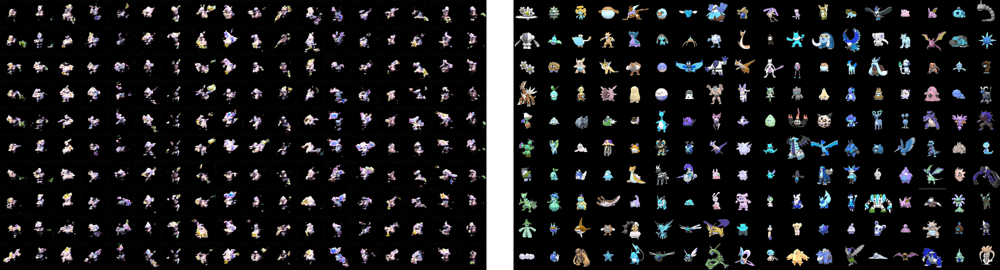

In [46]:
#!ls *.png
from IPython.display import Image
Image(filename='plot_pokemon_epoch_100_generated.png') 